In [39]:
!pip install geopandas
!apt install libspatialindex-dev
!pip install rtree

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
libspatialindex-dev is already the newest version (1.9.3-2).
0 upgraded, 0 newly installed, 0 to remove and 34 not upgraded.


In [40]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from shapely.geometry import Point, LineString, Polygon
import geopandas as gpd
from geopandas import GeoDataFrame
from geopandas import GeoSeries
from mpl_toolkits.axes_grid1 import make_axes_locatable

In [41]:
cuadrados = gpd.GeoSeries([Polygon([(1,1), (1,3), (4,3), (4,1)]), Polygon([(2,5), (2,7), (5,7), (5,5)])])

triangulos = gpd.GeoSeries([Polygon([(2,2), (4,5), (6,2)]), Polygon([(4,6), (6,9), (6,6)])])

In [42]:
df_cuadrados = gpd.GeoDataFrame({'geometry': cuadrados, 'df_cuadrados':[1,2]})

df_triangulos = gpd.GeoDataFrame({'geometry': triangulos, 'df_triangulos':[1,2]})

<Axes: >

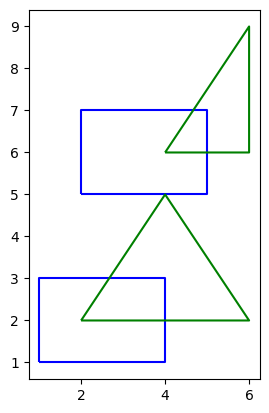

In [43]:
ax = df_cuadrados.boundary.plot(color='blue')

df_triangulos.boundary.plot(ax=ax, color='green')

<ipython-input-44-eea2c02e35e5>:4: UserWarning: `keep_geom_type=True` in overlay resulted in 1 dropped geometries of different geometry types than df1 has. Set `keep_geom_type=False` to retain all geometries
  union = gpd.overlay(df_cuadrados, df_triangulos, how='union')


<Axes: >

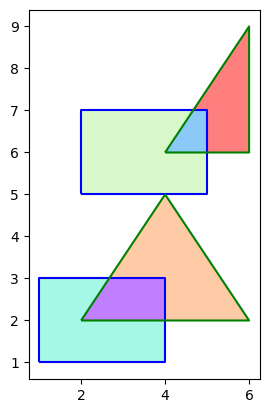

In [44]:
## operaciones de conjuntos mas comunes
## union

union = gpd.overlay(df_cuadrados, df_triangulos, how='union')
ax = union.plot(alpha=0.5, cmap='rainbow')

df_cuadrados.boundary.plot(ax=ax, color='blue')
df_triangulos.boundary.plot(ax=ax, color='green')

<ipython-input-45-fcff99b6fcc3>:4: UserWarning: `keep_geom_type=True` in overlay resulted in 1 dropped geometries of different geometry types than df1 has. Set `keep_geom_type=False` to retain all geometries
  interseccion = gpd.overlay(df_cuadrados, df_triangulos, how='intersection')


<Axes: >

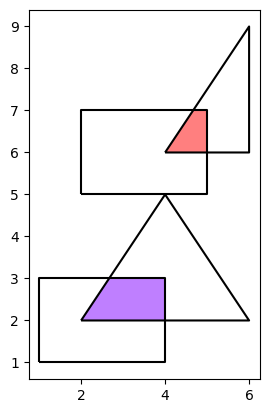

In [45]:
## operaciones de conjuntos mas comunes
## interseccion

interseccion = gpd.overlay(df_cuadrados, df_triangulos, how='intersection')
ax = interseccion.plot(alpha=0.5, cmap='rainbow')

df_cuadrados.boundary.plot(ax=ax, color='black')
df_triangulos.boundary.plot(ax=ax, color='black')

<Axes: >

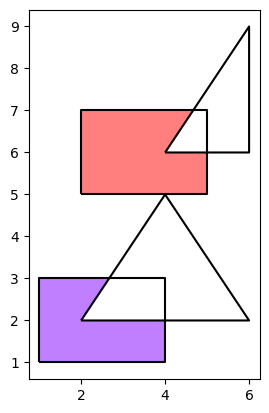

In [46]:
## operaciones de conjuntos mas comunes
## diferencia

interseccion = gpd.overlay(df_cuadrados, df_triangulos, how='difference')
ax = interseccion.plot(alpha=0.5, cmap='rainbow')

df_cuadrados.boundary.plot(ax=ax, color='black')
df_triangulos.boundary.plot(ax=ax, color='black')

<Axes: >

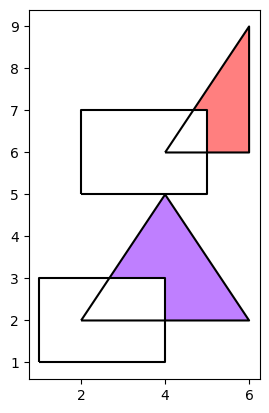

In [47]:
## operaciones de conjuntos mas comunes
## diferencia

interseccion = gpd.overlay(df_triangulos,df_cuadrados, how='difference')
ax = interseccion.plot(alpha=0.5, cmap='rainbow')

df_cuadrados.boundary.plot(ax=ax, color='black')
df_triangulos.boundary.plot(ax=ax, color='black')

<Axes: >

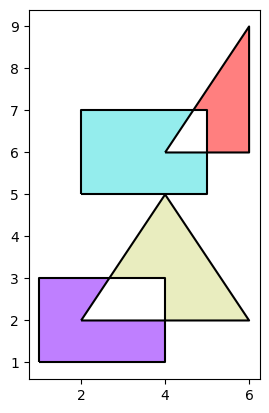

In [48]:
## operaciones de conjuntos mas comunes
## diferencia simetrica

interseccion = gpd.overlay(df_cuadrados, df_triangulos, how='symmetric_difference')
ax = interseccion.plot(alpha=0.5, cmap='rainbow')

df_cuadrados.boundary.plot(ax=ax, color='black')
df_triangulos.boundary.plot(ax=ax, color='black')

In [49]:
estados = gpd.read_file('/content/mexican-states.shp')
#columns = ['name','geometry']
#estados = estados[columns]
estados.head()
print(estados.crs)

EPSG:4326


/usr/local/lib/python3.11/dist-packages/pyogrio/raw.py:198: RuntimeWarning: /content/mexican-states.shp contains polygon(s) with rings with invalid winding order. Autocorrecting them, but that shapefile should be corrected using ogr2ogr for example.
  return ogr_read(


In [50]:
df = pd.read_csv('/content/1695864219680-mexican-capitals.csv')
capitales = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.Long, df.Lat))
#columns = ['Estado','geometry']
#capitales = capitales[columns]
capitales.set_crs(epsg=4326, inplace=True)
capitales.head()

,Estado,Capital,Lat,Long,geometry
0,Aguascalientes,Aguascalientes,21.880833,-102.296111,POINT (-102.29611 21.88083)
1,Baja California,Mexicali,32.663333,-115.467778,POINT (-115.46778 32.66333)
2,Baja California Sur,La Paz,24.142222,-110.310833,POINT (-110.31083 24.14222)
3,Campeche,San Francisco de Campeche,19.848611,-90.525278,POINT (-90.52528 19.84861)
4,Chiapas,Tuxtla Gutiérrez,16.753056,-93.115556,POINT (-93.11556 16.75306)


In [51]:
## pintamos el mapa

estados = estados.to_crs(epsg=3395)
capitales = capitales.to_crs(epsg=3395)


# Buffer and rebuild as GeoDataFrame
capitales_buffer = gpd.GeoDataFrame(geometry=capitales.buffer(120000), crs=capitales.crs)


<Axes: >

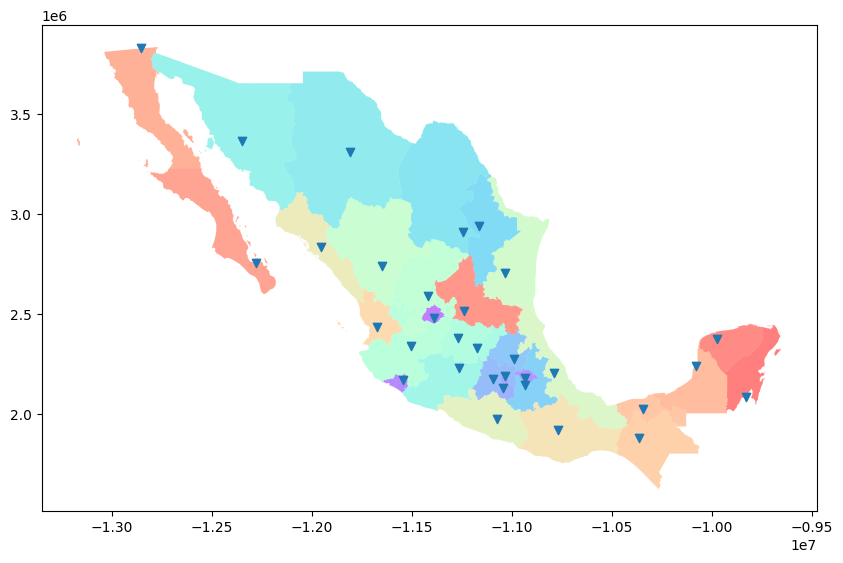

In [52]:

# Plot base map
fig, ax = plt.subplots(figsize=(10, 10))
estados.plot(ax=ax, alpha=0.5, cmap="rainbow")
#capitales_buffer.plot(ax=ax, color='gray', alpha=0.3)
capitales.plot(ax=ax, marker='v')
##, color='black', markersize=20
## Overlay: difference between states and buffered capitals
#zonas_urbanas = gpd.overlay(estados, capitales_buffer, how='difference')
#zonas_urbanas.plot(ax=ax, alpha=0.5, edgecolor='k', cmap="rainbow")

#ax.set_title("Estados sin Áreas Urbanas", fontsize=16)
#ax.set_axis_off()
#plt.tight_layout()
#plt.show()

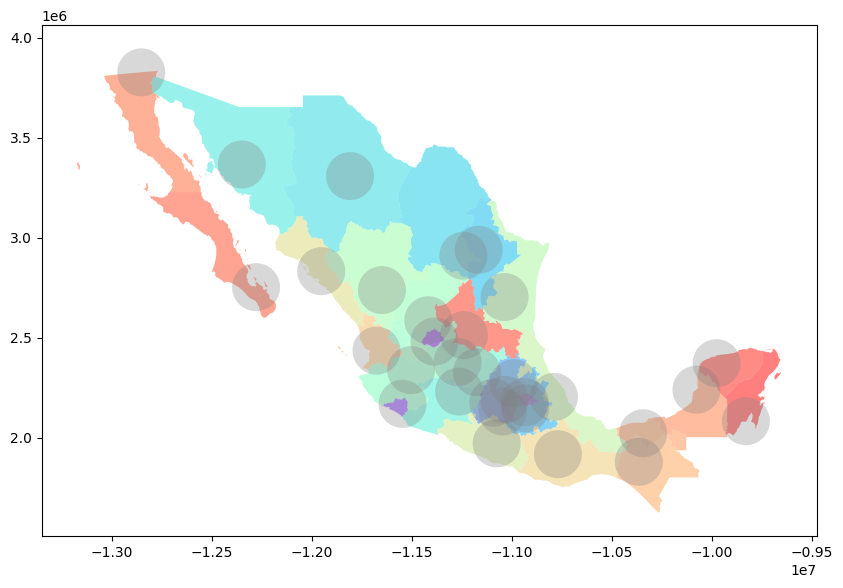

In [53]:
# Plot base map
fig, ax = plt.subplots(figsize=(10, 10))

estados.plot(ax=ax, alpha=0.5, cmap="rainbow")
capitales_buffer.plot(ax=ax, color='gray', alpha=0.3)

# Overlay: difference between states and buffered capitals

zonas_urbanas = gpd.overlay(estados, capitales_buffer, how='intersection',keep_geom_type=False)

zonas_urbanas = zonas_urbanas[zonas_urbanas.geometry.type.isin(['Polygon', 'MultiPolygon'])]


#ax.set_title("Estados sin Áreas Urbanas", fontsize=16)
#ax.set_axis_off()
#plt.tight_layout()
#plt.show()

<Axes: >

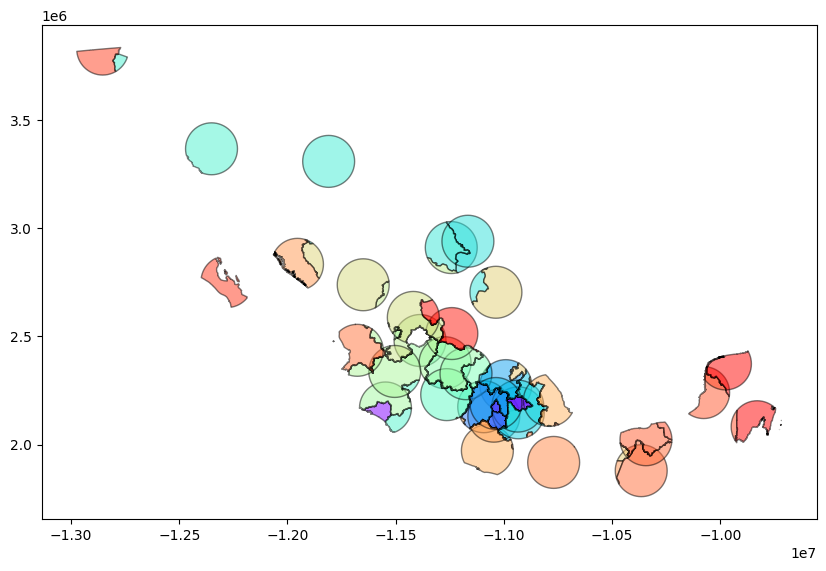

In [54]:
## se grafica la interseccion

fig, ax = plt.subplots(figsize=(10, 10))

zonas_urbanas.plot(ax=ax, alpha=0.5, edgecolor='k', cmap="rainbow")


In [55]:
## se geneta la diferencia

zonas_urbanasDif = gpd.overlay(estados, capitales_buffer, how='difference',keep_geom_type=False)

zonas_urbanasDif = zonas_urbanasDif[zonas_urbanasDif.geometry.type.isin(['Polygon', 'MultiPolygon'])]

<Axes: >

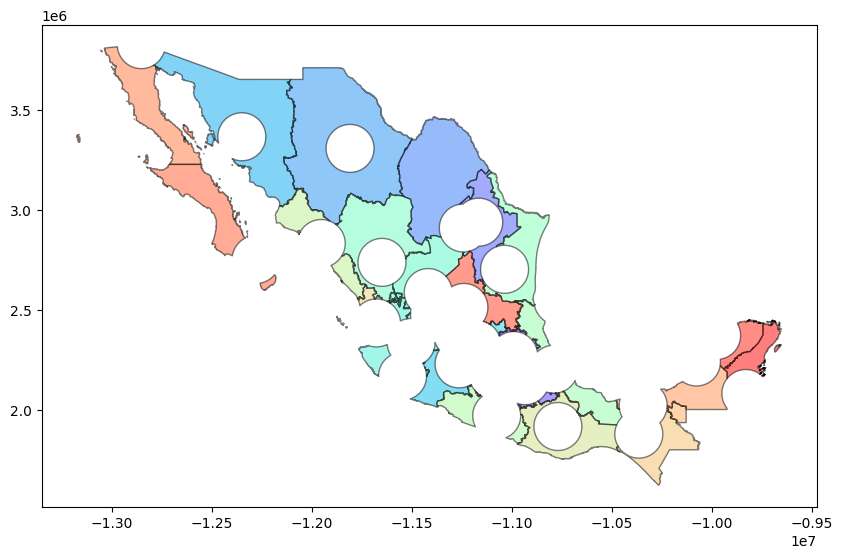

In [56]:
## se grafica la diferencia

fig, ax = plt.subplots(figsize=(10, 10))

zonas_urbanasDif.plot(ax=ax, alpha=0.5, edgecolor='k', cmap="rainbow")

In [57]:
## se geneta la union

zonas_urbanasUni = gpd.overlay(estados, capitales_buffer, how='difference',keep_geom_type=False)

zonas_urbanasUni = zonas_urbanasUni[zonas_urbanasUni.geometry.type.isin(['Polygon', 'MultiPolygon'])]

<Axes: >

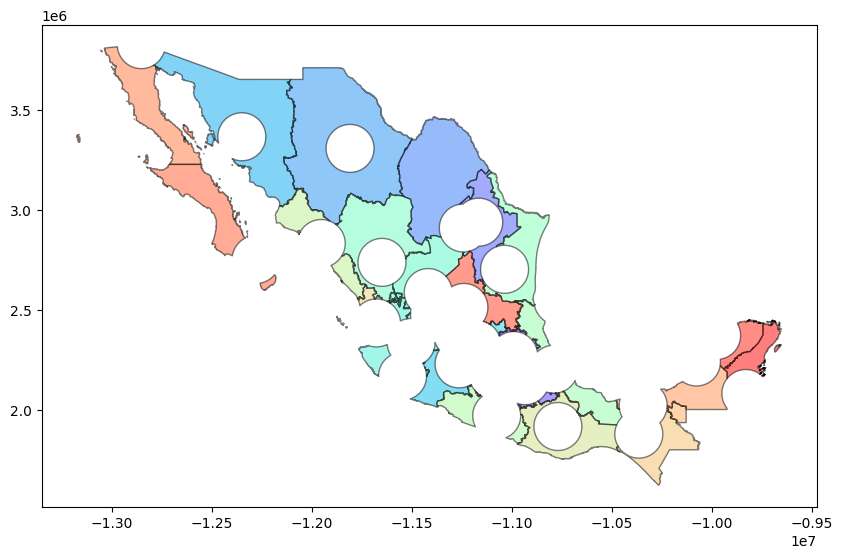

In [58]:
## se grafica la union

fig, ax = plt.subplots(figsize=(10, 10))

zonas_urbanasUni.plot(ax=ax, alpha=0.5, edgecolor='k', cmap="rainbow")

In [59]:
## se geneta la diferencia simetrica

zonas_urbanasSimDif = gpd.overlay(estados, capitales_buffer, how='symmetric_difference',keep_geom_type=False)

zonas_urbanasSimDif = zonas_urbanasSimDif[zonas_urbanasSimDif.geometry.type.isin(['Polygon', 'MultiPolygon'])]

<Axes: >

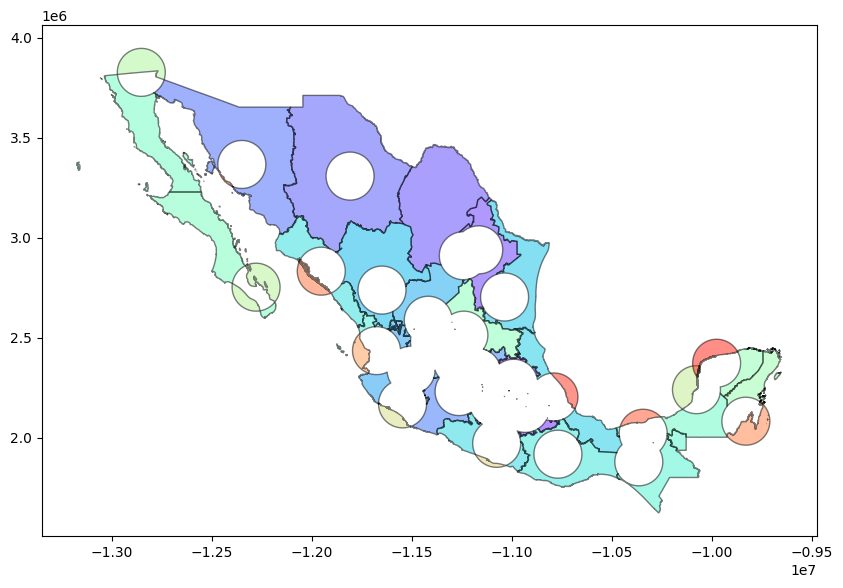

In [60]:
## se grafica la diferencia simetrica

fig, ax = plt.subplots(figsize=(10, 10))

zonas_urbanasSimDif.plot(ax=ax, alpha=0.5, edgecolor='k', cmap="rainbow")

In [61]:
## adjuntar geodataframe

estados = gpd.read_file('/content/mexican-states.shp')
#columns = ['ISO3166-2','name','geometry']
#estados = estados[columns]
estados = estados.loc[:, ['ISO3166-2', 'name', 'geometry']]
estados.head()
print(estados.crs)


EPSG:4326


/usr/local/lib/python3.11/dist-packages/pyogrio/raw.py:198: RuntimeWarning: /content/mexican-states.shp contains polygon(s) with rings with invalid winding order. Autocorrecting them, but that shapefile should be corrected using ogr2ogr for example.
  return ogr_read(


In [62]:
## separamos los estados del centro

hidalgo = estados.iloc[[6]]
tlaxcala = estados.iloc[[2]]
puebla = estados.iloc[[7]]
morelos = estados.iloc[[4]]
mexico = estados.iloc[[5]]
cdmx = estados.iloc[[3]]

In [63]:
mx_centro = pd.concat([hidalgo, tlaxcala, puebla, morelos, mexico, cdmx])

In [64]:
mx_centro.head()

,ISO3166-2,name,geometry
6,MX-HID,Hidalgo,"POLYGON ((-99.73527 20.56486, -99.73525 20.564..."
2,MX-TLA,Tlaxcala,"POLYGON ((-98.5415 19.46082, -98.54158 19.4607..."
7,MX-PUE,Puebla,"POLYGON ((-97.26671 19.38249, -97.26549 19.381..."
4,MX-MOR,Morelos,"POLYGON ((-98.90339 19.03848, -98.90061 19.038..."
5,MX-MEX,México,"POLYGON ((-100.13794 20.04431, -100.13759 20.0..."


<Axes: >

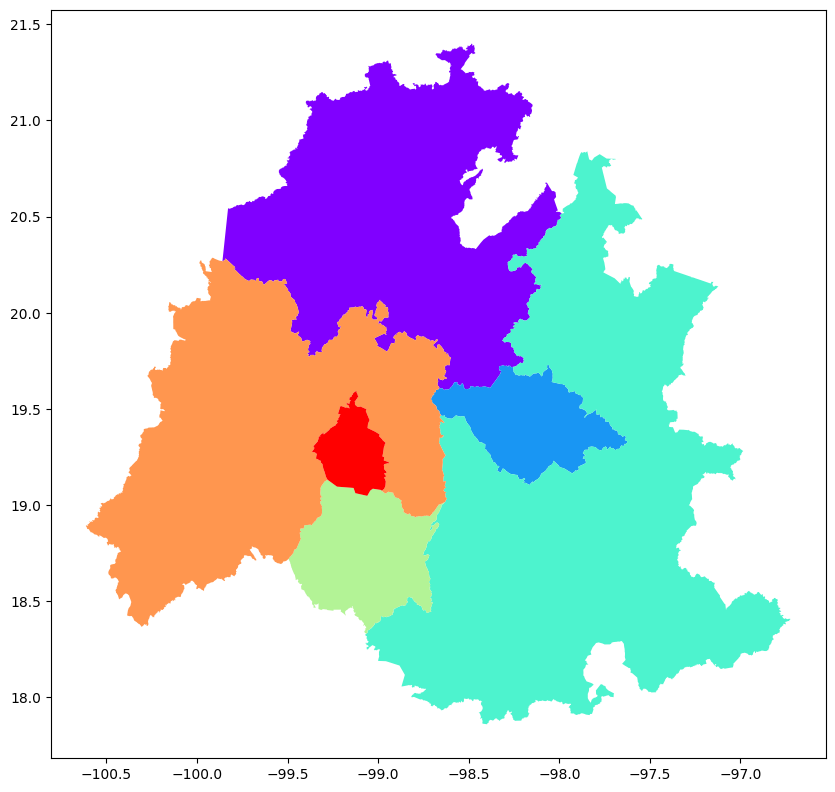

In [65]:
fig, ax = plt.subplots(figsize=(10, 10))

mx_centro.plot(ax=ax, cmap="rainbow")

In [66]:
## union por merge o join

estados = gpd.read_file('/content/mexican-states.shp')
columns = ['ISO3166-2','name','geometry']
estados = estados[columns]
estados.head()

/usr/local/lib/python3.11/dist-packages/pyogrio/raw.py:198: RuntimeWarning: /content/mexican-states.shp contains polygon(s) with rings with invalid winding order. Autocorrecting them, but that shapefile should be corrected using ogr2ogr for example.
  return ogr_read(


,ISO3166-2,name,geometry
0,MX-AGU,Aguascalientes,"MULTIPOLYGON (((-102.7453 21.72005, -102.74859..."
1,MX-COL,Colima,"MULTIPOLYGON (((-103.48859 18.96489, -103.4884..."
2,MX-TLA,Tlaxcala,"POLYGON ((-98.5415 19.46082, -98.54158 19.4607..."
3,MX-CMX,Ciudad de México,"POLYGON ((-99.2787 19.1317, -99.28259 19.13821..."
4,MX-MOR,Morelos,"POLYGON ((-98.90339 19.03848, -98.90061 19.038..."


In [67]:
capitals = pd.read_csv('/content/1695864219680-mexican-capitals.csv' )
columns = ['Estado','Capital']
capitals = capitals[columns]
capitals.head()

,Estado,Capital
0,Aguascalientes,Aguascalientes
1,Baja California,Mexicali
2,Baja California Sur,La Paz
3,Campeche,San Francisco de Campeche
4,Chiapas,Tuxtla Gutiérrez


In [68]:
## hacemos el merge, simepre al inico el geodataframe

estadosCapitales = pd.merge(estados, capitals, left_on='name', right_on='Estado')
estadosCapitales.head()

,ISO3166-2,name,geometry,Estado,Capital
0,MX-AGU,Aguascalientes,"MULTIPOLYGON (((-102.7453 21.72005, -102.74859...",Aguascalientes,Aguascalientes
1,MX-COL,Colima,"MULTIPOLYGON (((-103.48859 18.96489, -103.4884...",Colima,Colima
2,MX-TLA,Tlaxcala,"POLYGON ((-98.5415 19.46082, -98.54158 19.4607...",Tlaxcala,Tlaxcala de Xicohténcatl
3,MX-CMX,Ciudad de México,"POLYGON ((-99.2787 19.1317, -99.28259 19.13821...",Ciudad de México,Ciudad de México
4,MX-MOR,Morelos,"POLYGON ((-98.90339 19.03848, -98.90061 19.038...",Morelos,Cuernavaca


<Axes: >

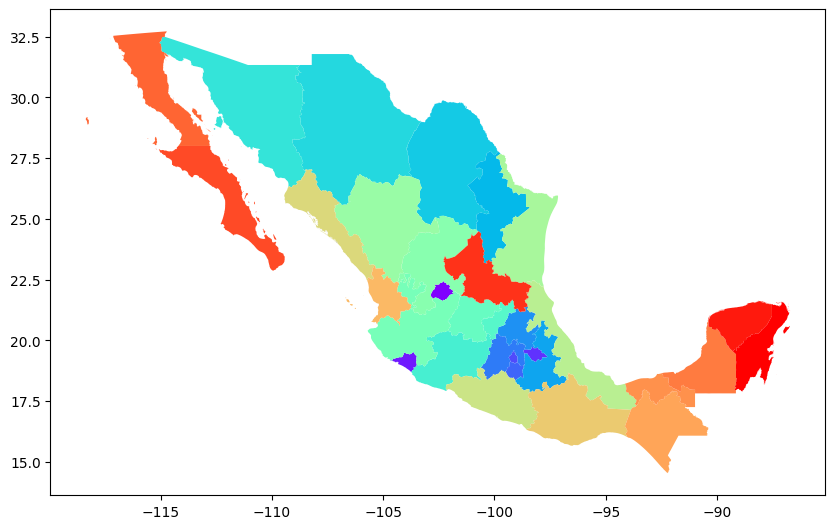

In [69]:
fig, ax = plt.subplots(figsize=(10, 10))

estadosCapitales.plot(ax=ax, cmap="rainbow")

In [70]:
## union a traves de distancia espacial

estados = gpd.read_file('/content/mexican-states.shp')
columns = ['ISO3166-2','name','geometry']
estados = estados[columns]
estados.head()

/usr/local/lib/python3.11/dist-packages/pyogrio/raw.py:198: RuntimeWarning: /content/mexican-states.shp contains polygon(s) with rings with invalid winding order. Autocorrecting them, but that shapefile should be corrected using ogr2ogr for example.
  return ogr_read(


,ISO3166-2,name,geometry
0,MX-AGU,Aguascalientes,"MULTIPOLYGON (((-102.7453 21.72005, -102.74859..."
1,MX-COL,Colima,"MULTIPOLYGON (((-103.48859 18.96489, -103.4884..."
2,MX-TLA,Tlaxcala,"POLYGON ((-98.5415 19.46082, -98.54158 19.4607..."
3,MX-CMX,Ciudad de México,"POLYGON ((-99.2787 19.1317, -99.28259 19.13821..."
4,MX-MOR,Morelos,"POLYGON ((-98.90339 19.03848, -98.90061 19.038..."


In [71]:
##asignamos region a cada estado

estados['region'] = ['centro oeste','centro oeste','centro','centro','centro',

                     'centro','centro','centro','noreste','noreste',

                     'noreste','noroeste','centro oeste','centro oeste','centro oeste',

                     'centro oeste','centro oeste','noreste','noreste','sureste',

                     'sureste','noroeste','sureste','centro oeste','sureste',

                     'sureste','sureste','noroeste','noroeste','centro oeste','sureste','sureste']


estados.head()

,ISO3166-2,name,geometry,region
0,MX-AGU,Aguascalientes,"MULTIPOLYGON (((-102.7453 21.72005, -102.74859...",centro oeste
1,MX-COL,Colima,"MULTIPOLYGON (((-103.48859 18.96489, -103.4884...",centro oeste
2,MX-TLA,Tlaxcala,"POLYGON ((-98.5415 19.46082, -98.54158 19.4607...",centro
3,MX-CMX,Ciudad de México,"POLYGON ((-99.2787 19.1317, -99.28259 19.13821...",centro
4,MX-MOR,Morelos,"POLYGON ((-98.90339 19.03848, -98.90061 19.038...",centro


In [72]:
## disolvemos por regiones

regiones = estados.dissolve(by='region')
regiones.head()

,geometry,ISO3166-2,name
region,,,
centro,"POLYGON ((-99.06596 18.33265, -99.06612 18.333...",MX-TLA,Tlaxcala
centro oeste,"MULTIPOLYGON (((-106.24013 21.33311, -106.2398...",MX-AGU,Aguascalientes
noreste,"POLYGON ((-104.24942 22.7484, -104.24981 22.74...",MX-NLE,Nuevo León
noroeste,"MULTIPOLYGON (((-114.2928 27.11006, -114.29281...",MX-SON,Sonora
sureste,"MULTIPOLYGON (((-96.05972 15.77985, -96.06001 ...",MX-VER,Veracruz de Ignacio de la Llave


In [75]:
## filtramos columnas

regiones = regiones.loc[:, 'geometry']

In [84]:
# GeoDataFrame que contiene las regiones de la República Mexicana

regiones_gdf = gpd.GeoDataFrame(gpd.GeoSeries(regiones))
regiones_gdf

,geometry
region,
centro,"POLYGON ((-99.06596 18.33265, -99.06612 18.333..."
centro oeste,"MULTIPOLYGON (((-106.24013 21.33311, -106.2398..."
noreste,"POLYGON ((-104.24942 22.7484, -104.24981 22.74..."
noroeste,"MULTIPOLYGON (((-114.2928 27.11006, -114.29281..."
sureste,"MULTIPOLYGON (((-96.05972 15.77985, -96.06001 ..."


<Axes: >

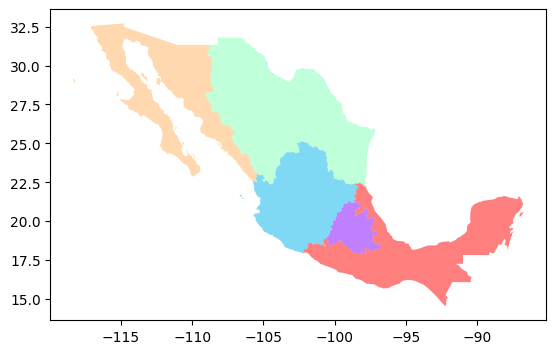

In [85]:
# Graficamos las regiones de México

regiones_gdf.plot(alpha=0.5, cmap='rainbow')

In [87]:
# Hacemos el join de los estados y las regiones

estados_por_regiones = gpd.sjoin(estados, regiones_gdf, how="inner", predicate='intersects')
estados_por_regiones

,ISO3166-2,name,geometry,region_left,region_right
0,MX-AGU,Aguascalientes,"MULTIPOLYGON (((-102.7453 21.72005, -102.74859...",centro oeste,centro oeste
1,MX-COL,Colima,"MULTIPOLYGON (((-103.48859 18.96489, -103.4884...",centro oeste,centro oeste
2,MX-TLA,Tlaxcala,"POLYGON ((-98.5415 19.46082, -98.54158 19.4607...",centro,centro
3,MX-CMX,Ciudad de México,"POLYGON ((-99.2787 19.1317, -99.28259 19.13821...",centro,centro
4,MX-MOR,Morelos,"POLYGON ((-98.90339 19.03848, -98.90061 19.038...",centro,sureste
...,...,...,...,...,...
29,MX-SLP,San Luis Potosí,"POLYGON ((-100.06938 23.09686, -100.06903 23.0...",centro oeste,centro
29,MX-SLP,San Luis Potosí,"POLYGON ((-100.06938 23.09686, -100.06903 23.0...",centro oeste,centro oeste
29,MX-SLP,San Luis Potosí,"POLYGON ((-100.06938 23.09686, -100.06903 23.0...",centro oeste,noreste
30,MX-YUC,Yucatán,"MULTIPOLYGON (((-87.53511 21.47936, -87.53278 ...",sureste,sureste


<Axes: >

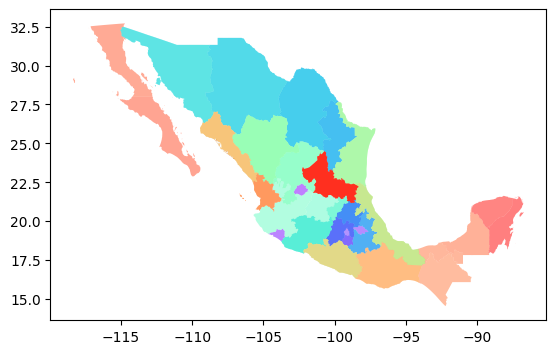

In [89]:
# Graficamos nuevamente para comprobar que es un GeoDataFrame

estados_por_regiones.plot(alpha=0.5, cmap='rainbow')

In [ ]:
## atributos de predict
#intersects
#contains
#within
#touches
#crosses
#overlap

## atributos de how
#left
#right
#inner
#outer